In [1]:
import numpy as np
import pylidc as pl
import pandas as pd
import matplotlib.pyplot as plt
from pylidc.utils import consensus
from skimage.measure import find_contours
import os
from scipy.ndimage import gaussian_filter
import seaborn as sns
from sklearn.ensemble import ExtraTreesClassifier
from scipy.stats.stats import pearsonr
import scipy.cluster.hierarchy as shc
from sklearn.cluster import AgglomerativeClustering

import ipywidgets as widgets
from ipywidgets import interact, interact_manual

# Standard plotly imports
import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode
import plotly as pty

# Using plotly + cufflinks in offline mode
import cufflinks as cf
cf.go_offline(connected=True)
init_notebook_mode(connected=True)

import geopandas as gpd
import json
from bokeh.io import output_notebook, show, output_file
from bokeh.plotting import figure
from bokeh.models import GeoJSONDataSource, LinearColorMapper, ColorBar, CategoricalColorMapper
from bokeh.palettes import brewer
from fuzzywuzzy import process

from maps import slider_map, match_names, replace_names
import plotly.express as px

C:\Users\Joakim\.conda\envs\ada\lib\site-packages\fuzzywuzzy\fuzz.py:11: UserWarning:

Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning



# Analysing medical data to help improve society's quality of life

How can we use medical data to help improve society's quality of life?<br>
There is endless types of medical data out there for different diseases, which data should we use in order to help as many people as possible?<br>

To explore this question, we have subdivided it into some more specific areas that can gain us different types of information. They are shown in this scheme.

![title](Images/scheme.png)

# 1. Which diseases have the most significant negative impact on society's quality of life as of today? How does differ between countries and over time?
The ***prevelance*** of the disease alone is not enough to quantify this, take herpes for example. The herpes simplex virus is one of the most common diseases on earth. It is estimated that well over 50% of the world population is infected with the virus. However, most people are completely unaware that they are and show little to no symptoms while others do have severe symptoms. There is no cure and once you are infected, the virus will most likely stay in your body for the rest of your life.<br> 
***Conclusion:*** quality of life is only significantly effected if the disease causes pain or limits the patient ablilities.

The most severe effect of a disease is when it causes death, after all, you can't have any "quality of life" anymore if your life has come to an end. <br> 
***Conclusion:*** If we want to have a big impact on society's quality of life it might be interesting to look at the diseases that cause the most deaths.

## 1.1 Most common causes of death

We start by loading data from the GBD dataset, which contains the number of deaths from different causes, for different countries, from the year 1990 to 2017.

In [2]:
data=pd.read_csv("data/annual-number-of-deaths-by-cause.csv" )
print(data.shape)
data.head(5)

(6686, 36)


,Entity,Code,Year,Dementia,Cardiovascular diseases,Kidney disease,Respiratory disease,Liver disease,"Diabetes, blood and endocrine disease",Digestive disease,...,Heat-related deaths (hot or cold exposure),Nutritional deficiencies,Suicide,Execution,Meningitis (deaths),Lower respiratory infections (deaths),Intestinal infectious diseases (deaths),Protein-energy malnutrition (deaths),Conflict (deaths),Terrorism (deaths)
0,Afghanistan,AFG,1990,856.0,28372.0,2708.0,3394.0,1349.0,6177.0,1708.0,...,222.0,567.0,703.0,NaN,6469.977091,22836.912346,295.382207,1607.703797,1508.0,12.0
1,Afghanistan,AFG,1991,908.0,30368.0,2851.0,3641.0,1443.0,6522.0,1792.0,...,230.0,588.0,754.0,NaN,6347.158764,22325.633931,303.866598,1558.132316,3498.0,68.0
2,Afghanistan,AFG,1992,970.0,33035.0,3057.0,3967.0,1572.0,7009.0,1911.0,...,250.0,623.0,820.0,NaN,6659.741428,23205.280750,317.750121,1617.721576,4341.0,49.0
3,Afghanistan,AFG,1993,1066.0,36512.0,3329.0,4398.0,1735.0,7655.0,2071.0,...,289.0,674.0,894.0,NaN,8068.386263,28229.715397,333.978331,1931.808553,NaN,NaN
4,Afghanistan,AFG,1994,1161.0,40285.0,3641.0,4870.0,1911.0,8377.0,2243.0,...,315.0,731.0,977.0,NaN,9432.845127,32652.297630,348.419085,2351.629206,9090.0,22.0


In [3]:
# One of the entities is "world" which contains the summations over all countries. 
# Let's see which diseases are most prevalent world wide
df = data[data["Entity"]=='World'].iloc[:,2:].sort_values(6572, ascending=False, axis=1)

In [4]:
df

,Cardiovascular diseases,Cancers,Respiratory disease,"Diabetes, blood and endocrine disease",Lower respiratory infections (deaths),Dementia,Neonatal deaths,Diarrheal diseases,Road incidents,Liver disease,...,Intestinal infectious diseases (deaths),Drug disorder,Hepatitis,Fire,Conflict (deaths),Heat-related deaths (hot or cold exposure),Terrorism (deaths),Natural disasters,Year,Execution
6546,12334351.0,5700044.0,3289518.0,1599080.0,3.415941e+06,959208.0,2927283.0,2814874.0,1117119.0,846323.0,...,215726.866669,89378.0,160752.0,154659.0,88988.0,62118.0,7148.0,50497.0,1990,NaN
6547,12501972.0,5809813.0,3335799.0,1638315.0,3.387086e+06,992223.0,2886770.0,2781379.0,1132209.0,863783.0,...,215646.590310,93045.0,161535.0,155497.0,85558.0,63095.0,8429.0,157288.0,1991,NaN
6548,12795069.0,5955812.0,3422152.0,1689665.0,3.354599e+06,1026182.0,2842181.0,2721689.0,1153290.0,886304.0,...,215606.845540,97460.0,162524.0,156532.0,52374.0,65925.0,9742.0,10562.0,1992,NaN
6549,13225897.0,6132271.0,3509371.0,1746780.0,3.316737e+06,1063224.0,2795805.0,2675579.0,1181224.0,913622.0,...,214899.286344,102252.0,164412.0,159361.0,NaN,70257.0,NaN,21489.0,1993,NaN
6550,13553332.0,6287064.0,3582124.0,1804262.0,3.269526e+06,1099730.0,2753695.0,2636813.0,1209047.0,939276.0,...,214790.481155,107054.0,165766.0,161154.0,543424.0,72786.0,7690.0,13335.0,1994,NaN
6551,13717727.0,6396818.0,3621689.0,1859990.0,3.228872e+06,1137501.0,2712771.0,2577416.0,1225920.0,959512.0,...,213023.435733,109914.0,166605.0,161004.0,50538.0,72094.0,6103.0,20121.0,1995,NaN
6552,13765966.0,6476175.0,3644792.0,1907175.0,3.174943e+06,1173818.0,2671308.0,2524413.0,1238668.0,970772.0,...,210315.595196,112528.0,166391.0,158864.0,65613.0,70712.0,6966.0,15647.0,1996,NaN
6553,13843602.0,6565474.0,3665237.0,1960281.0,3.137364e+06,1210936.0,2628884.0,2474525.0,1251760.0,983123.0,...,207946.180115,114439.0,166730.0,156689.0,54770.0,68502.0,10924.0,18590.0,1997,NaN
6554,13980264.0,6677612.0,3688493.0,2016698.0,3.090783e+06,1251638.0,2588265.0,2429245.0,1259942.0,994130.0,...,205136.300074,116234.0,166306.0,153728.0,71144.0,67207.0,4688.0,48372.0,1998,NaN
6555,14300291.0,6826126.0,3685035.0,2080663.0,3.031894e+06,1294832.0,2549478.0,2387511.0,1278964.0,1009283.0,...,202578.839371,116543.0,165196.0,153342.0,101004.0,68033.0,3393.0,67196.0,1999,NaN


In [5]:
data.columns

Index(['Entity', 'Code', 'Year', 'Dementia', 'Cardiovascular diseases',
       'Kidney disease', 'Respiratory disease', 'Liver disease',
       'Diabetes, blood and endocrine disease', 'Digestive disease',
       'Hepatitis', 'Cancers', 'Parkinson's disease', 'Fire', 'Malaria',
       'Drowning', 'Homicide', 'HIV/AIDS', 'Drug disorder', 'Tuberculosis',
       'Road incidents', 'Maternal deaths', 'Neonatal deaths',
       'Alcohol disorder', 'Natural disasters', 'Diarrheal diseases',
       'Heat-related deaths (hot or cold exposure)',
       'Nutritional deficiencies', 'Suicide', 'Execution',
       'Meningitis (deaths)', 'Lower respiratory infections (deaths)',
       'Intestinal infectious diseases (deaths)',
       'Protein-energy malnutrition (deaths)', 'Conflict (deaths)',
       'Terrorism (deaths)'],
      dtype='object')

In [6]:
fig = px.line(df.melt(id_vars="Year", var_name = "Disease" ,value_name = "Number of death"), 
              x="Year", y = "Number of death", color="Disease",  hover_name="Disease",
              title= 'Amount of recorded deaths 1990-2017', template="plotly_white" )
fig.show()

In [7]:
pty.offline.plot(fig, filename='Amount_of_recorded_deaths.html')

'Amount_of_recorded_deaths.html'

It is clear that cardiovascular disease is by far the most common cause of death, followed by cancer, respiratory disease, ... <br> Note that cardiovascular diease is also the faster growing cause of death!

### 1.1.1 Difference between countries

Lets normalize this dataframe to obtain a ratio and not a strict number of deaths, to be able to compare between different countries.

In [8]:
# Copy the df 
normalized = data.copy()

In [9]:
# Check the type of the values, to see if any problems. 
normalized.dtypes

Entity                                         object
Code                                           object
Year                                            int64
Dementia                                      float64
Cardiovascular diseases                       float64
Kidney disease                                float64
Respiratory disease                           float64
Liver disease                                 float64
Diabetes, blood and endocrine disease         float64
Digestive disease                             float64
Hepatitis                                     float64
Cancers                                       float64
Parkinson's disease                           float64
Fire                                          float64
Malaria                                       float64
Drowning                                      float64
Homicide                                      float64
HIV/AIDS                                      float64
Drug disorder               

We see that Execution are not floats but object. Lets remove this column before computing the total

In [10]:
normalized = data.copy()

# remove the execution.

normalized = normalized.drop('Execution', 1)

# Take the colums to take into account 
column = normalized.columns.to_list()[3:]
normalized.loc[ :, "Dementia" : "Terrorism (deaths)"] = normalized.loc[ :, "Dementia" : "Terrorism (deaths)"].fillna(0)
# Compute the total 

normalized['Total'] = normalized[column].sum(axis = 1)
normalized = normalized[normalized['Total'] != 0]
normalized.loc[ :, "Dementia" : "Terrorism (deaths)"] = normalized.loc[ :, "Dementia" : "Terrorism (deaths)"].fillna(0).div(
                                normalized['Total'], axis = 0).multiply(100, axis=0)




In [11]:
normalized

,Entity,Code,Year,Dementia,Cardiovascular diseases,Kidney disease,Respiratory disease,Liver disease,"Diabetes, blood and endocrine disease",Digestive disease,...,Heat-related deaths (hot or cold exposure),Nutritional deficiencies,Suicide,Meningitis (deaths),Lower respiratory infections (deaths),Intestinal infectious diseases (deaths),Protein-energy malnutrition (deaths),Conflict (deaths),Terrorism (deaths),Total
0,Afghanistan,AFG,1990,0.670757,22.232152,2.121975,2.659521,1.057069,4.840265,1.338380,...,0.173958,0.444298,0.550867,5.069840,17.894886,0.231460,1.259788,1.181661,0.009403,127616.975442
1,Afghanistan,AFG,1991,0.667732,22.332238,2.096589,2.677545,1.061164,4.796195,1.317814,...,0.169139,0.432408,0.554482,4.667619,16.417985,0.223460,1.145831,2.572384,0.050006,135982.791609
2,Afghanistan,AFG,1992,0.669092,22.787081,2.108676,2.736381,1.084344,4.834710,1.318181,...,0.172447,0.429737,0.565625,4.593797,16.006678,0.219180,1.115882,2.994361,0.033800,144972.493876
3,Afghanistan,AFG,1993,0.675171,23.125563,2.108485,2.785556,1.098895,4.848438,1.311707,...,0.183044,0.426891,0.566232,5.110264,17.879822,0.211531,1.223547,0.000000,0.000000,157885.888544
4,Afghanistan,AFG,1994,0.633114,21.968141,1.985503,2.655699,1.042103,4.568130,1.223149,...,0.171775,0.398628,0.532776,5.143902,17.805890,0.189999,1.282386,4.956942,0.011997,183379.191047
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6681,Zimbabwe,ZWE,2013,0.929580,9.921815,1.172681,2.136900,0.682699,4.439436,2.112338,...,0.074316,1.934105,1.280376,1.146287,8.255469,0.015755,2.208805,0.000000,0.000630,158781.429228
6682,Zimbabwe,ZWE,2014,1.001369,10.563191,1.261277,2.256049,0.720353,4.820161,2.246154,...,0.075861,2.097730,1.370781,1.167600,8.471076,0.016903,2.229873,0.000000,0.000000,151592.446930
6683,Zimbabwe,ZWE,2015,1.074389,11.002319,1.335577,2.345186,0.755311,5.137631,2.347942,...,0.088212,2.193572,1.467206,1.191332,8.709321,0.017515,2.249353,0.000000,0.000000,145105.777215
6684,Zimbabwe,ZWE,2016,1.158454,11.423604,1.401630,2.423253,0.786246,5.434241,2.446649,...,0.090748,2.326124,1.556894,1.207683,8.858661,0.018257,2.260703,0.000000,0.000000,141050.060551


We will use Plotly to plot interactive plots as our data vary in term of country and years, it will be easier like this. 


For one country: look at evolution of one disease over time, look at different diseases in one year;

- for one year: look at different countries for one disease : Super dirty

In [12]:
normalized.drop("Total", 1, inplace=True)
normalized[column].sum(axis = 1) == 100.


0        True
1        True
2        True
3        True
4       False
        ...  
6681     True
6682     True
6683     True
6684     True
6685    False
Length: 6610, dtype: bool

In [13]:
normalized.drop("Total", 1, inplace=True)

KeyError: "['Total'] not found in axis"

In [ ]:
diseases = sorted(normalized.columns.to_list()[3:])
countries = sorted(normalized.Entity.unique())
years = sorted(normalized.Year.unique())[:-1]

In [ ]:
melted = normalized.melt(id_vars=["Entity","Code", "Year"], var_name = "Disease" ,value_name = "Ratio")

In [ ]:
melted

In [ ]:
melted[ (melted["Entity"] == "Palestine")]

In [ ]:

# For one country, one year : look a différent diases
data_dropdown = []
#year = 2010

for count in countries: 
    for dis in diseases:

        df = melted[(melted["Disease"] == dis) & (melted["Entity"] == count) & (melted["Year"] != 2017)]
        data_dropdown.append(dict(type = "bar", name= dis  , x = df["Year"], y = df["Ratio"],
                                  visible = count ==countries[0], ))
             #hover_data=['lifeExp', 'gdpPercap'], color='lifeExp',
             #labels={'pop':'population of Canada'}, height=400)

fig = go.Figure(data = data_dropdown)            

buttons_1 = []
for i, name in enumerate(countries):
    visible = [False]*len(countries)
    visible[i] = True
    buttons_1.append(
        dict(
            method='restyle',
            args=[{'visible': visible}],
            label=name
        ))


fig.update_layout(barmode='stack')
        
fig.update_layout(
    updatemenus=list([
        dict(
            x=0,
            y=1.15,
            pad={"r": 10, "t": 10},
            buttons=buttons_1,
            yanchor='top',
            xanchor="left",

        )
    ]),
    #template="THEME",
    title_text = "Difference between countries",
        )            


fig.show()


In [ ]:
pty.offline.plot(fig, filename='1.1.1.html')

### 1.1.2 Evolution over time

Let's look at how the prevalence and number of deaths of different diseases have changed over the years in different countries.

In [ ]:
disease_change = normalized.copy()
disease_change[(disease_change.Year == 2017) | (disease_change.Year == 1990)].head()

We see that for 2017, only the columns with (deaths) in their name have values. To be able to compare better, we use the data from 2016.

In [ ]:
disease_change = normalized.copy()
disease_change[(disease_change.Year == 2016) | (disease_change.Year == 1990)].head()

Now we can compute the difference between 2016 and 1990.

In [ ]:
diseases = normalized.columns.tolist()[3:35]

# Create a new dataframe, start with the country names and codes to be able to plot this on a map later
diseases_change = normalized[['Entity', 'Code']].drop_duplicates().set_index('Entity')

for disease in diseases:
    # Compute the difference between the mortality rates of 2016 and 1990 for every disease in every country
    diseases_change[disease] = normalized.groupby('Entity')[disease].apply(lambda x : x.tail(2).values[0] - x.head(1).values[0])
    
diseases_change

Let us zoom in on cardiovascular diseases and visualise this. First, we saw that this difference could not be computed for every country, so let's drop those who generated a NaN.

In [ ]:
diseases_change = diseases_change.dropna(subset=['Cardiovascular diseases'])
diseases_change

Let's visualise this data on a map.

Inspiration for this code and source for the shapefile: https://towardsdatascience.com/a-complete-guide-to-an-interactive-geographical-map-using-python-f4c5197e23e0

In [ ]:
shapefile = 'data/countries_110m/ne_110m_admin_0_countries.shp'

gdf = gpd.read_file(shapefile)[['ADMIN', 'ADM0_A3', 'geometry']]
gdf.columns = ['country', 'country_code', 'geometry']
gdf.head()

In [ ]:
diseases_changed_map = gdf.merge(diseases_change, left_on = 'country_code', right_on = 'Code', how = 'left')

In [ ]:
diseases_changed_map

In [28]:
columns = ["Dementia",
       'Cardiovascular diseases', 'Kidney disease', 'Respiratory disease',
       'Liver disease', 'Diabetes, blood and endocrine disease',
       'Digestive disease', 'Hepatitis', 'Cancers', "Parkinson's disease",
       'Fire', 'Malaria', 'Drowning', 'Homicide', 'HIV/AIDS', 'Drug disorder',
       'Tuberculosis', 'Road incidents', 'Maternal deaths', 'Neonatal deaths',
       'Alcohol disorder', 'Natural disasters', 'Diarrheal diseases',
       'Heat-related deaths (hot or cold exposure)',
       'Nutritional deficiencies', 'Suicide', 'Meningitis (deaths)',
       'Lower respiratory infections (deaths)',
       'Intestinal infectious diseases (deaths)',
       'Protein-energy malnutrition (deaths)', 'Conflict (deaths)',
       'Terrorism (deaths)']
columns = sorted(columns)

In [29]:
#Some constants for colors and theme
COLOR_SCALE = "Reds"
MARKER_LINE_COLOR = "white"
THEME = "plotly_white"
MARKER_LINE_WIDTH = 0.5

data_dropdown = []
for col in columns:


    # I select the year (and remove DC for now)

    ### create the dictionary with the data for the current year
    data_one_dis = dict(
                        type='choropleth',
                        locations = diseases_changed_map['Code'],
                        z=diseases_changed_map[col],
                        name = col,
                        colorscale = COLOR_SCALE,
                        autocolorscale=False,
                        reversescale=False,
                        marker_line_color= MARKER_LINE_COLOR,
                        marker_line_width=MARKER_LINE_WIDTH,
                        text = diseases_changed_map["country"],
                        colorbar_title= "Proportion of total deaths for {} ".format(col) ,
                        visible=col == sorted(columns)[0], 
                        )

    data_dropdown.append(data_one_dis)  # I add the dictionary to the list of dictionaries for the slider
##  I create the steps for the slider

buttons = []
for i, name in enumerate(columns):
    visible = [False]*len(columns)
    visible[i] = True
    buttons.append(
        dict(
            method='restyle',
            args=[{'visible': visible}],
            label=name
        ))


##  I create the 'sliders' object from the 'steps'

# I set up the layout (including slider option)


# I create the figure object:

fig = go.Figure(data=data_dropdown)

# to plot in the notebook

#plotly.offline.iplot(fig)
fig.update_layout(geo=dict(showframe=False,
        showcoastlines=False,
        projection_type='equirectangular'),
    template=THEME, 
    updatemenus=list([
        dict(
            x=0.1,
            y=1.1,
            pad={"r": 10, "t": 10},
            buttons=buttons,
            yanchor='top',
            xanchor="left",

        )
    ]),
    title_text = "Change between 1990 and 2016 in proportion of total deaths"
        )
fig.show()

In [30]:
pty.offline.plot(fig, filename='1.1.2.html')

'1.1.2.html'

In general we see that cardiovascular disease is becoming more prevelent in developing countries while its prevelence is decreasing in developed countries.
Note that Syria is a clear outlier in the Middle East, this may very well be a result of war. <br>
These are very interesting metrics to further analyse in questions 3 and 4 (risk factors). 

To be able to do this, the difference should first be computed for multiple diseases in all countries, and we should make sure that the values all make sense (i.e. make sure there are no missing values, or that they are handled well).

## 1.3 Years of Life Lost

The Global Burden of Diseases dataset also contains a number of other interesting measures to see the impact of diseases on people. Let's start by looking at one of them: Years of Life Lost (YYLs). According to the description of the dataset, this is the definition of this measure:

>Years of life lost due to premature mortality. YLLs are the multiplication of deaths and a standard life expectancy at the age of death. The standard life expectancy is derived from a life table that contains the lowest observed mortality rate at each age that has been observed in any population greater than 5 million.

To get these values, we run a new query to the GBD database to get the values for this measure, and for a few others as well, and load this data.

In [14]:
## Load data for all years
data2=pd.read_csv("data/gbd-all-measures-all-years-1.csv" )
for i in range(2,6):
    extra_dataframe = pd.read_csv("data/gbd-all-measures-all-years-" + str(i) + ".csv")
    data2 = data2.append(extra_dataframe)
    print(extra_dataframe.shape)
print(data2.shape)
data2

(500000, 10)
(500000, 10)
(500000, 10)
(129400, 10)
(2129400, 10)


,measure,location,sex,age,cause,metric,year,val,upper,lower
0,YLLs (Years of Life Lost),Samoa,Both,All Ages,Neglected tropical diseases and malaria,Number,1993,14.171667,26.041295,9.123137
1,YLLs (Years of Life Lost),Samoa,Both,All Ages,Neglected tropical diseases and malaria,Percent,1993,0.000497,0.000895,0.000331
2,YLLs (Years of Life Lost),Samoa,Both,All Ages,Neglected tropical diseases and malaria,Rate,1993,8.516462,15.649513,5.482548
3,YLLs (Years of Life Lost),Samoa,Both,All Ages,Mental disorders,Number,1992,0.209891,0.539310,0.096168
4,YLLs (Years of Life Lost),Samoa,Both,All Ages,Mental disorders,Percent,1992,0.000007,0.000019,0.000003
...,...,...,...,...,...,...,...,...,...,...
129395,DALYs (Disability-Adjusted Life Years),Guam,Both,All Ages,Sense organ diseases,Percent,2017,0.027513,0.037053,0.020102
129396,DALYs (Disability-Adjusted Life Years),Guam,Both,All Ages,Sense organ diseases,Rate,2017,863.886411,1252.302081,576.163719
129397,DALYs (Disability-Adjusted Life Years),Guam,Both,All Ages,Substance use disorders,Number,2017,625.126969,775.343312,486.084116
129398,DALYs (Disability-Adjusted Life Years),Guam,Both,All Ages,Substance use disorders,Percent,2017,0.011901,0.013844,0.009949


Let's look at all the different diseases included in this dataset.

In [15]:
data2['cause'].unique().tolist()

['Neglected tropical diseases and malaria',
 'Mental disorders',
 'Musculoskeletal disorders',
 'Other infectious diseases',
 'Maternal and neonatal disorders',
 'Substance use disorders',
 'Diabetes and kidney diseases',
 'Neurological disorders',
 'Self-harm and interpersonal violence',
 'Nutritional deficiencies',
 'Digestive diseases',
 'Neoplasms',
 'Transport injuries',
 'Unintentional injuries',
 'Chronic respiratory diseases',
 'Other non-communicable diseases',
 'Skin and subcutaneous diseases',
 'Cardiovascular diseases',
 'HIV/AIDS and sexually transmitted infections',
 'Respiratory infections and tuberculosis',
 'Enteric infections',
 'Sense organ diseases']

We see that the disease categories in this dataset are not the same as in the previous one. The GBD query tool allows to extract values at for very specific diseases, or more aggregated categories of diseases. When performing future analyses, we will use this set of diseases, which corresponds to all the "Level 2 causes" from the GBD dataset.

Let us now look at the different measures included in the dataset.

In [16]:
data2['measure'].unique().tolist()

['YLLs (Years of Life Lost)',
 'Incidence',
 'Deaths',
 'Prevalence',
 'YLDs (Years Lived with Disability)',
 'DALYs (Disability-Adjusted Life Years)']

Let's look at the Years of Life Lost. To decide which metric (absolute number, percentage or rate) to take, we compare the values of these metrics for the same disease in two countries which are close to each other, but have a different population.

In [17]:
data2[(data2.measure == 'YLLs (Years of Life Lost)') & (data2.cause == 'Neoplasms') & ((data2.location == 'Luxembourg')|(data2.location == 'Netherlands')) & (data2.year == 2017)]

,measure,location,sex,age,cause,metric,year,val,upper,lower
362049,YLLs (Years of Life Lost),Luxembourg,Both,All Ages,Neoplasms,Number,2017,24719.846391,26942.056844,22658.815482
362050,YLLs (Years of Life Lost),Luxembourg,Both,All Ages,Neoplasms,Percent,2017,0.362265,0.371621,0.350915
362051,YLLs (Years of Life Lost),Luxembourg,Both,All Ages,Neoplasms,Rate,2017,4185.926360,4562.223573,3836.922427
269237,YLLs (Years of Life Lost),Netherlands,Both,All Ages,Neoplasms,Number,2017,938823.389505,993245.867184,886666.298582
269238,YLLs (Years of Life Lost),Netherlands,Both,All Ages,Neoplasms,Percent,2017,0.415261,0.421762,0.405521
269239,YLLs (Years of Life Lost),Netherlands,Both,All Ages,Neoplasms,Rate,2017,5513.054268,5832.639480,5206.772089


We will work with the rate of YLLs per 100k people (instead of the total number, or the percentage of all years of life lost for diseases), so we can compare the impact of different diseases in different countries.

Now, we can visualise this data on a map.

**TODO: convert to plotly (interactive year)**

**NICE TO HAVE: select disease**

In [18]:
def plot_map(dataset, title_string = ""):
    dataset = gdf.merge(dataset, left_on = 'country', right_on = 'location', how = 'left')

    #Read data to json
    dataset_json = json.loads(dataset.to_json())

    #Convert to str like object
    dataset_json_data = json.dumps(dataset_json)

    #Input GeoJSON source that contains features for plotting.
    geosource = GeoJSONDataSource(geojson = dataset_json_data)

    #Define a sequential multi-hue color palette.
    palette = brewer['OrRd'][7]
    
    #Reverse color order so that dark blue is highest obesity.
    palette = palette[::-1]

    #Instantiate LinearColorMapper that linearly maps numbers in a range, into a sequence of colors.
    color_mapper = LinearColorMapper(palette = palette, low = dataset.val.min(), high = dataset.val.max())

    #Define custom tick labels for color bar.
    #tick_labels = {'0': '0', '1': '1', '2':'2', '3':'3', '4':'4', '5':'5', '6':'6','7':'7'}

    #Create color bar. 
    color_bar = ColorBar(color_mapper=color_mapper, label_standoff=7,width = 500, height = 20,
    border_line_color=None,location = (0,0), orientation = 'horizontal', major_label_overrides = tick_labels)

    #Create figure object.
    p = figure(title = title_string, plot_height = 600 , plot_width = 950, toolbar_location = None)
    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None

    #Add patch renderer to figure. 
    p.patches('xs','ys', source = geosource,fill_color = {'field' :'val', 'transform' : color_mapper},
              line_color = 'black', line_width = 0.25, fill_alpha = 1)

    #Specify figure layout.
    p.add_layout(color_bar, 'below')

    #Display figure inline in Jupyter Notebook.
    output_notebook()

    #Display figure.
    show(p)

In [19]:
slider_map(df, z_col_name, title, country_col_name = 'country', zmin = 0, zmax = 10,  year_col = 'Year' , location_col_name ='Code' ):

SyntaxError: invalid syntax (<ipython-input-19-a45973848b65>, line 1)

In [20]:
# Lets intereact with our data to explore it 
@interact
def interact_yll(year = list(np.append(data2.year.unique(),[0])),
                        disease = list(np.append(data2.cause.unique(), [0]))):
    yll_subset = data2
    yll_subset = data2[(data2['year']==year) & (data2['cause'] == disease) & (data2['metric'] == 'Rate') & (data2['measure'] == 'YLLs (Years of Life Lost)')][['location','val']]
    
    plot_map(yll_subset)
    
    return yll_subset

interactive(children=(Dropdown(description='year', options=(1993, 1992, 1991, 1990, 1994, 1995, 1996, 1997, 19…

In [21]:
countryInfo=pd.read_csv("data/all.csv")
countryInfo.head(5)

,name,alpha-2,alpha-3,country-code,iso_3166-2,region,sub-region,intermediate-region,region-code,sub-region-code,intermediate-region-code
0,Afghanistan,AF,AFG,4,ISO 3166-2:AF,Asia,Southern Asia,NaN,142.0,34.0,NaN
1,Åland Islands,AX,ALA,248,ISO 3166-2:AX,Europe,Northern Europe,NaN,150.0,154.0,NaN
2,Albania,AL,ALB,8,ISO 3166-2:AL,Europe,Southern Europe,NaN,150.0,39.0,NaN
3,Algeria,DZ,DZA,12,ISO 3166-2:DZ,Africa,Northern Africa,NaN,2.0,15.0,NaN
4,American Samoa,AS,ASM,16,ISO 3166-2:AS,Oceania,Polynesia,NaN,9.0,61.0,NaN


In [22]:
def match_names(countryNames, countryNames2, similarity_limit=65):
    countryNames = np.unique(countryNames)
    countryNames2 = np.unique(countryNames2)
    missingPair = np.setdiff1d(countryNames, countryNames2)
    missingPairs2 = np.setdiff1d(countryNames2, countryNames)
    pairs = []
    similarities = []
    for name in missingPair:
        name_clean = name.replace("Republic", "")
        pair, similairity = process.extractOne(name_clean, missingPairs2)
        pairs.append(pair)
        similarities.append(similairity)
    for i in range(len(pairs)):
        pairDf = pd.DataFrame({'Country': missingPair, 'Replacement': pairs, 'Similarity': similarities})
        noFound = pairDf[pairDf['Similarity'] <= similarity_limit]
        print("No matches found for:")
        for name in noFound["Country"]:
            print(name)
        pairDf = pairDf[pairDf['Similarity'] > similarity_limit]
        pairDf = pairDf.reset_index(drop=True)
    return pairDf
def replace_names(df, old, new):
    dfNew=df.replace(list(old.values), list(new.values))
    for i in range(len(new)):
        print("Replaced", old[i], "with", new[i])
    return dfNew

In [23]:
pairDf=match_names(data2["location"], countryInfo["name"])
pairDf

No matches found for:
Swaziland
No matches found for:
Swaziland
No matches found for:
Swaziland
No matches found for:
Swaziland
No matches found for:
Swaziland
No matches found for:
Swaziland
No matches found for:
Swaziland
No matches found for:
Swaziland
No matches found for:
Swaziland
No matches found for:
Swaziland
No matches found for:
Swaziland
No matches found for:
Swaziland
No matches found for:
Swaziland
No matches found for:
Swaziland
No matches found for:
Swaziland
No matches found for:
Swaziland
No matches found for:
Swaziland
No matches found for:
Swaziland
No matches found for:
Swaziland
No matches found for:
Swaziland
No matches found for:
Swaziland
No matches found for:
Swaziland
No matches found for:
Swaziland
No matches found for:
Swaziland
No matches found for:
Swaziland


,Country,Replacement,Similarity
0,Bolivia,Bolivia (Plurinational State of),90
1,Brunei,Brunei Darussalam,90
2,Cape Verde,Cabo Verde,80
3,Cote d'Ivoire,Côte d'Ivoire,96
4,Czech Republic,Czechia,83
5,Democratic Republic of the Congo,"Congo, Democratic Republic of the",95
6,Federated States of Micronesia,Micronesia (Federated States of),95
7,Iran,Iran (Islamic Republic of),90
8,Laos,Lao People's Democratic Republic,68
9,Macedonia,North Macedonia,90


In [24]:
pairDf=pairDf.replace("United States Minor Outlying Islands", 'United States of America')
index=pairDf.index[pairDf['Country']=="South Korea"]
pairDf.loc[index, "Replacement"]='Korea, Republic of'
pairDf

,Country,Replacement,Similarity
0,Bolivia,Bolivia (Plurinational State of),90
1,Brunei,Brunei Darussalam,90
2,Cape Verde,Cabo Verde,80
3,Cote d'Ivoire,Côte d'Ivoire,96
4,Czech Republic,Czechia,83
5,Democratic Republic of the Congo,"Congo, Democratic Republic of the",95
6,Federated States of Micronesia,Micronesia (Federated States of),95
7,Iran,Iran (Islamic Republic of),90
8,Laos,Lao People's Democratic Republic,68
9,Macedonia,North Macedonia,90


In [25]:
data2=replace_names(data2, pairDf["Country"], pairDf["Replacement"])

Replaced Bolivia with Bolivia (Plurinational State of)
Replaced Brunei with Brunei Darussalam
Replaced Cape Verde with Cabo Verde
Replaced Cote d'Ivoire with Côte d'Ivoire
Replaced Czech Republic with Czechia
Replaced Democratic Republic of the Congo with Congo, Democratic Republic of the
Replaced Federated States of Micronesia with Micronesia (Federated States of)
Replaced Iran with Iran (Islamic Republic of)
Replaced Laos with Lao People's Democratic Republic
Replaced Macedonia with North Macedonia
Replaced Moldova with Moldova, Republic of
Replaced North Korea with Korea (Democratic People's Republic of)
Replaced Palestine with Palestine, State of
Replaced South Korea with Korea, Republic of
Replaced Syria with Syrian Arab Republic
Replaced Taiwan (Province of China) with Taiwan, Province of China
Replaced Tanzania with Tanzania, United Republic of
Replaced The Bahamas with Bahamas
Replaced The Gambia with Gambia
Replaced United Kingdom with United Kingdom of Great Britain and North

In [26]:
data2

,measure,location,sex,age,cause,metric,year,val,upper,lower
0,YLLs (Years of Life Lost),Samoa,Both,All Ages,Neglected tropical diseases and malaria,Number,1993,14.171667,26.041295,9.123137
1,YLLs (Years of Life Lost),Samoa,Both,All Ages,Neglected tropical diseases and malaria,Percent,1993,0.000497,0.000895,0.000331
2,YLLs (Years of Life Lost),Samoa,Both,All Ages,Neglected tropical diseases and malaria,Rate,1993,8.516462,15.649513,5.482548
3,YLLs (Years of Life Lost),Samoa,Both,All Ages,Mental disorders,Number,1992,0.209891,0.539310,0.096168
4,YLLs (Years of Life Lost),Samoa,Both,All Ages,Mental disorders,Percent,1992,0.000007,0.000019,0.000003
...,...,...,...,...,...,...,...,...,...,...
129395,DALYs (Disability-Adjusted Life Years),Guam,Both,All Ages,Sense organ diseases,Percent,2017,0.027513,0.037053,0.020102
129396,DALYs (Disability-Adjusted Life Years),Guam,Both,All Ages,Sense organ diseases,Rate,2017,863.886411,1252.302081,576.163719
129397,DALYs (Disability-Adjusted Life Years),Guam,Both,All Ages,Substance use disorders,Number,2017,625.126969,775.343312,486.084116
129398,DALYs (Disability-Adjusted Life Years),Guam,Both,All Ages,Substance use disorders,Percent,2017,0.011901,0.013844,0.009949


In [27]:
#Check for non-matching
countryNames, countryNames2=data2["location"], countryInfo["name"]
countryNames=np.unique(countryNames)
countryNames2=np.unique(countryNames2)
missingPair=np.setdiff1d(countryNames, countryNames2)
missingPair

array(['Swaziland'], dtype=object)

In [29]:
yll_subset = data2[(data2['cause'] == "Cardiovascular diseases") & (data2['metric'] == 'Rate') & (data2['measure'] == 'YLLs (Years of Life Lost)')][['location','val','year']]
map_test2 = countryInfo.merge(yll_subset, left_on = 'name', right_on = 'location', how = 'left')
map_test2.dropna(subset=['year'], axis = 0, inplace= True)
slider_map(map_test2, z_col_name = "val", title = "YLLs per 100k people due to cardiovascular diseases", year_col = 'year', country_col_name='name', location_col_name ='alpha-3',zmin = 0, zmax = 20000)

We can see very interesting clusters of countries pop up for different diseases, i.e. for neoplasms (cancers), neglected tropical diseases and malaria, substance abuse disorders, and more. This is clearly an interesting measure to look at.

## 1.4 Comparison of measures

There are still four other measures in the dataset. To be able to decide which one we want to use for future analyses, let's look for the top 5 diseases with the biggest impact worldwide in 2017 according to all different measures.

In [30]:
# Create a dataframe to store the aggregated values for every measure for every disease
df_measures = pd.DataFrame()

for measure in data2.measure.unique():
    # Compute the total sum of this measure for all countries, per diseases
    subset = data2[(data2.measure == measure) & (data2.metric == 'Number') & (data2.year == 2017)]
    # Rank this descendingly
    top = subset.groupby('cause').sum().sort_values('val', ascending=False)[['val']]
    # Show the top 5
    df_measures[measure] = top['val']
    print("======")
    print(measure)
    print(top.head())

YLLs (Years of Life Lost)
                                                  val
cause                                                
Cardiovascular diseases                  3.286893e+08
Neoplasms                                2.245686e+08
Maternal and neonatal disorders          1.674996e+08
Respiratory infections and tuberculosis  1.480551e+08
Enteric infections                       8.457405e+07
Incidence
                                                  val
cause                                                
Respiratory infections and tuberculosis  1.787982e+10
Enteric infections                       6.296568e+09
Other non-communicable diseases          4.194298e+09
Skin and subcutaneous diseases           4.169790e+09
Nutritional deficiencies                 1.184060e+09
Deaths
                                                  val
cause                                                
Cardiovascular diseases                  1.770676e+07
Neoplasms                              

In [31]:
df_measures.reset_index(level=0, inplace=True)

In [32]:
columns = ['YLLs (Years of Life Lost)', 'Incidence', 'Deaths', 'Prevalence',
       'YLDs (Years Lived with Disability)',
       'DALYs (Disability-Adjusted Life Years)']

In [33]:
sorted(df_measures[col])

NameError: name 'col' is not defined

In [ ]:
#data_canada = df_measures[df_measures.country == 'Canada']

data_dropdown = []
for col in columns:
    sort = df_measures.sort_values(by = col )
    data_dropdown.append(dict(type = "bar", x= sort[col], y= sort["cause"], orientation='h', 
                 name = col,visible=col == sorted(columns)[0]))
             #hover_data=['lifeExp', 'gdpPercap'], color='lifeExp',
             #labels={'pop':'population of Canada'}, height=400)

fig = go.Figure(data = data_dropdown)            
            
buttons = []
for i, name in enumerate(columns):
    visible = [False]*len(columns)
    visible[i] = True
    buttons.append(
        dict(
            method='restyle',
            args=[{'visible': visible}],
            label=name
        ))

fig.update_traces(marker_color='rgb(158,202,225)',
                  marker_line_width=1.5, opacity=0.6)     

fig.update_layout(
    updatemenus=list([
        dict(
            x=0.1,
            y=1.15,
            pad={"r": 10, "t": 10},
            buttons=buttons,
            yanchor='top',
            xanchor="left",

        )
    ]),
    template=THEME,
    title_text = "Comparison of measures",
    
        )
fig.show()



In [ ]:
pty.offline.plot(fig, filename='comp_of_measures.html')

The different measures clearly give rise to very different and interesting rankings. From these rankings and the definition of the measures, we can infer the following:

* **Deaths** represent, of course, how many people actually die from these diseases. Since this is the most intuitive measure, let us compare the other measures with this.
* **YLLs (Years of Life Lost)** generates a rather similar ranking to the deaths one. However, this takes into account the age at which the person dies from this diseases: that explains why maternal and neonatal disorders is number three in this ranking, while it is not in the top 5 of deaths, because people die at a much earlier age from these disorders, leading to a higher number of years of life lost.
* **YLDs (Years Lived with Disability)** shows mostly diseases from which people don't (quickly) die, but which have a high impact on quality of life (disabilities which have a high impact are weighted higher in this measure), such as musculoskeletal disorders (such as paralysis).
* **DALYs (Disability-Adjusted Life Years)** is defined as the sum of the Years of Life Lost and Years Lived with Disability, leading to the 'number of healthy life years lost'. This can be seen in the ranking: it is a mix of diseases from which many people die, such as cardiovascular diseases and neoplasms (cancers), and diseases which have a long-lasting high impact on life (such as musculoskeletal diseases).
* **Incidence** is the number of people who contracted a certain disease in 2017. Here we see some diseases, like respiratory infections, skin and subcutaneous diseases and others, which are very common, but are quickly cured: so the people don't die from them and don't have to live with them for long, when comparing to the deaths ranking.
* **Prevalence** is the number of people who lived with that disease in 2017. This metric can be compared to the Years Lived with Disabilities, since they both emphasise diseases people live with for a long time, but this metric is not weighted by the impact of the disease on the quality of life, so diseases like Sense organ diseases (like hearing or vision impairment), which have a relatively lower impact than musculoskeletal diseases, are ranked higher.

Let's look at the (Pearson) correlations between the measures to see if we can infer further information from this.

In [34]:
df_measures.corr(method='pearson')

,YLLs (Years of Life Lost),Incidence,Deaths,Prevalence,YLDs (Years Lived with Disability),DALYs (Disability-Adjusted Life Years)
YLLs (Years of Life Lost),1.000000,0.115069,0.907980,-0.237743,-0.357735,0.896022
Incidence,0.115069,1.000000,-0.028867,0.326746,-0.173678,0.040097
Deaths,0.907980,-0.028867,1.000000,-0.183921,-0.166458,0.888866
Prevalence,-0.237743,0.326746,-0.183921,1.000000,0.281694,-0.119523
YLDs (Years Lived with Disability),-0.357735,-0.173678,-0.166458,0.281694,1.000000,0.094089
DALYs (Disability-Adjusted Life Years),0.896022,0.040097,0.888866,-0.119523,0.094089,1.000000


* **Deaths** and **YLLs** are strongly positively correlated. This shows that even though YLLs take into account how old a person is at time of death, this only slightly changes the ranking.
* **DALYS** are strongly positively correlated with YLLs (and as such also with Deaths), and only weakly positively correlated with YLDs. This means that apparently, the YLLs have a much higher impact on this value than the YLDs.
* Both **Prevalence** and **YLDs** are negatively correlated with Deaths. This affirms our conclusion from earlier that these measures emphasize diseases from which people don't always die, but just live with for a long time.
* Similarly, **Incidence** and **YLDs** are negatively correlated: showing that YLDs emphasise diseases that not many people get each year, but with which they do live for a long time.
* Also **Prevalence** and **Deaths** are negatively correlated, showing that diseases with high prevalence are diseases with which people live for a long time, but which don't always cause death.

All of these measures clearly have their own merit and provide different insights. However, since we want to explore the impact diseases have on society, the DALYs measure is probably the most interesting. We will primarily use this measure for all future analyses.

According to the DALYs, the four diseases with the biggest impact are cardiovascular diseases, maternal and neonatal disorders, neoplasms (cancers) and respiratory infections and tuberculosis. To finish this part, let's look at which countries are most affected by these diseases.

In [35]:
dalys_subset1 = data2[(data2['cause'] == "Cardiovascular diseases") & (data2['metric'] == 'Rate') & (data2['measure'] == 'DALYs (Disability-Adjusted Life Years)')][['location','val','year']]
map_test3 = countryInfo.merge(dalys_subset1, left_on = 'name', right_on = 'location', how = 'left')
map_test3.dropna(subset=['year'], axis = 0, inplace= True)
slider_map(map_test3, z_col_name = "val", title = "DALYs lost per 100k people due to cardiovascular diseases", year_col = 'year', country_col_name='name', location_col_name ='alpha-3',zmin = 0, zmax = 20000)

In [36]:
dalys_subset2 = data2[(data2['cause'] == "Neoplasms") & (data2['metric'] == 'Rate') & (data2['measure'] == 'DALYs (Disability-Adjusted Life Years)')][['location','val','year']]
map_test4 = countryInfo.merge(dalys_subset2, left_on = 'name', right_on = 'location', how = 'left')
map_test4.dropna(subset=['year'], axis = 0, inplace= True)
slider_map(map_test4, z_col_name = "val", title = "DALYs lost per 100k people due to neoplasms", year_col = 'year', country_col_name='name', location_col_name ='alpha-3',zmin = 0, zmax = 9000)

In [37]:
dalys_subset3 = data2[(data2['cause'] == "Maternal and neonatal disorders") & (data2['metric'] == 'Rate') & (data2['measure'] == 'DALYs (Disability-Adjusted Life Years)')][['location','val','year']]
map_test5 = countryInfo.merge(dalys_subset3, left_on = 'name', right_on = 'location', how = 'left')
map_test5.dropna(subset=['year'], axis = 0, inplace= True)
slider_map(map_test5, z_col_name = "val", title = "DALYs lost per 100k people due to maternal and neonatal disorders", year_col = 'year', country_col_name='name', location_col_name ='alpha-3',zmin = 0, zmax = dalys_subset3.val.max())

In [38]:
dalys_subset4 = data2[(data2['cause'] == "Respiratory infections and tuberculosis") & (data2['metric'] == 'Rate') & (data2['measure'] == 'DALYs (Disability-Adjusted Life Years)')][['location','val','year']]
map_test6 = countryInfo.merge(dalys_subset4, left_on = 'name', right_on = 'location', how = 'left')
map_test6.dropna(subset=['year'], axis = 0, inplace= True)
slider_map(map_test6, z_col_name = "val", title = "DALYs lost per 100k people due to respiratory infections and tuberculosis", year_col = 'year', country_col_name='name', location_col_name ='alpha-3',zmin = 0, zmax = dalys_subset4.val.max())

Based on this very quick analysis, we can see that cardiovascular diseases and neoplasms cause the biggest impact in the developed world (with the former having an especially large impact on Eastern Europe), and maternal and neonatal diseases, together with respiratory infections and tuberculosis, have a bigger impact on the developing world. This geographical diversity makes analysing these four diseases more interesting.

In the next chapters, let us look at in which countries have a similar impact due to these diseases in the last 30 years, and at the different risk factors and economic factors that might lead to these diseases having a higher impact.

# 2. Is the prevalence of diseases in a country correlated with that of other countries? What can this tell us about the spread of diseases?

In [39]:
data2.head(30)

,measure,location,sex,age,cause,metric,year,val,upper,lower
0,YLLs (Years of Life Lost),Samoa,Both,All Ages,Neglected tropical diseases and malaria,Number,1993,1.417167e+01,26.041295,9.123137e+00
1,YLLs (Years of Life Lost),Samoa,Both,All Ages,Neglected tropical diseases and malaria,Percent,1993,4.974041e-04,0.000895,3.309780e-04
2,YLLs (Years of Life Lost),Samoa,Both,All Ages,Neglected tropical diseases and malaria,Rate,1993,8.516462e+00,15.649513,5.482548e+00
3,YLLs (Years of Life Lost),Samoa,Both,All Ages,Mental disorders,Number,1992,2.098912e-01,0.539310,9.616776e-02
4,YLLs (Years of Life Lost),Samoa,Both,All Ages,Mental disorders,Percent,1992,7.399359e-06,0.000019,3.401891e-06
5,YLLs (Years of Life Lost),Samoa,Both,All Ages,Mental disorders,Rate,1992,1.269623e-01,0.326226,5.817146e-02
6,YLLs (Years of Life Lost),Samoa,Both,All Ages,Musculoskeletal disorders,Number,1991,7.119414e+01,94.926946,5.300575e+01
7,YLLs (Years of Life Lost),Samoa,Both,All Ages,Musculoskeletal disorders,Percent,1991,2.448456e-03,0.003154,1.912545e-03
8,YLLs (Years of Life Lost),Samoa,Both,All Ages,Musculoskeletal disorders,Rate,1991,4.327142e+01,57.696095,3.221662e+01
9,YLLs (Years of Life Lost),Djibouti,Both,All Ages,Other infectious diseases,Number,1990,2.200374e+04,33674.267602,1.384016e+04


In [40]:
mergedData=countryInfo.merge(data2, left_on = 'name', right_on = 'location', how = 'left').drop("location", axis=1)
mergedData=mergedData.drop(["sex", "age"], axis=1) #only has values both and nan, and all ages and nan, dropped
mergedData

,name,alpha-2,alpha-3,country-code,iso_3166-2,region,sub-region,intermediate-region,region-code,sub-region-code,intermediate-region-code,measure,cause,metric,year,val,upper,lower
0,Afghanistan,AF,AFG,4,ISO 3166-2:AF,Asia,Southern Asia,NaN,142.0,34.0,NaN,YLLs (Years of Life Lost),Cardiovascular diseases,Number,1990.0,1.136721e+06,1.372865e+06,686326.354218
1,Afghanistan,AF,AFG,4,ISO 3166-2:AF,Asia,Southern Asia,NaN,142.0,34.0,NaN,YLLs (Years of Life Lost),Cardiovascular diseases,Percent,1990.0,1.025570e-01,1.228987e-01,0.063497
2,Afghanistan,AF,AFG,4,ISO 3166-2:AF,Asia,Southern Asia,NaN,142.0,34.0,NaN,YLLs (Years of Life Lost),Cardiovascular diseases,Rate,1990.0,1.135996e+04,1.371990e+04,6858.887251
3,Afghanistan,AF,AFG,4,ISO 3166-2:AF,Asia,Southern Asia,NaN,142.0,34.0,NaN,YLLs (Years of Life Lost),Chronic respiratory diseases,Number,1990.0,1.501491e+05,1.885786e+05,86531.287887
4,Afghanistan,AF,AFG,4,ISO 3166-2:AF,Asia,Southern Asia,NaN,142.0,34.0,NaN,YLLs (Years of Life Lost),Chronic respiratory diseases,Percent,1990.0,1.354638e-02,1.675152e-02,0.007868
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2118530,Zimbabwe,ZW,ZWE,716,ISO 3166-2:ZW,Africa,Sub-Saharan Africa,Eastern Africa,2.0,202.0,14.0,DALYs (Disability-Adjusted Life Years),Other non-communicable diseases,Percent,2017.0,3.413523e-02,3.833918e-02,0.029974
2118531,Zimbabwe,ZW,ZWE,716,ISO 3166-2:ZW,Africa,Sub-Saharan Africa,Eastern Africa,2.0,202.0,14.0,DALYs (Disability-Adjusted Life Years),Other non-communicable diseases,Rate,2017.0,1.620592e+03,1.913299e+03,1347.482459
2118532,Zimbabwe,ZW,ZWE,716,ISO 3166-2:ZW,Africa,Sub-Saharan Africa,Eastern Africa,2.0,202.0,14.0,DALYs (Disability-Adjusted Life Years),Skin and subcutaneous diseases,Number,2017.0,9.744526e+04,1.458894e+05,63104.791503
2118533,Zimbabwe,ZW,ZWE,716,ISO 3166-2:ZW,Africa,Sub-Saharan Africa,Eastern Africa,2.0,202.0,14.0,DALYs (Disability-Adjusted Life Years),Skin and subcutaneous diseases,Percent,2017.0,1.393542e-02,2.001048e-02,0.009462


Creates three dataframes, one for each measure: rateData, numberData, percentData.

In [41]:
#Rate
rateDf=mergedData[mergedData["metric"]=="Rate"]
columnsToKeep=['name','measure', 'year', 'alpha-2','alpha-3','country-code','iso_3166-2', 'region', 'sub-region',]
pivoted=pd.pivot_table(rateDf, index=columnsToKeep, columns="cause", values="val")
rateData=pivoted.reset_index()
print(rateData.shape)

(32424, 31)


In [42]:
#Percent
perDf=mergedData[mergedData["metric"]=="Percent"]
columnsToKeep=['name','measure', 'year', 'alpha-2','alpha-3','country-code','iso_3166-2', 'region', 'sub-region',]
pivoted=pd.pivot_table(perDf, index=columnsToKeep, columns="cause", values="val")
percentData=pivoted.reset_index()
print(percentData.shape)

(32424, 31)


In [43]:
#Number
numDf=mergedData[mergedData["metric"]=="Number"]
columnsToKeep=['name','measure', 'year', 'alpha-2','alpha-3','country-code','iso_3166-2', 'region', 'sub-region',]
pivoted=pd.pivot_table(numDf, index=columnsToKeep, columns="cause", values="val")
numberData=pivoted.reset_index()
print(numberData.shape)

(32424, 31)


Create a function for grouping and plotting.

In [102]:
def plot_world_groups(data, disease, measure, distance, cut_off_Range, linkage_type="complete"):
    diseaseData=data[data["measure"]==measure]
    diseaseData=pd.pivot_table(diseaseData, index="year", columns="name", values=disease)
    #Correlation matrix
    corr=diseaseData.corr(method ='pearson') 
    fig, ax = plt.subplots(figsize=(10,10))
    ax = sns.heatmap(
        corr, 
        vmin=-1, vmax=1, center=0,
        cmap=sns.diverging_palette(0, 250, n=200),
        square=True
    )
    ax.set_xticklabels(
        ax.get_xticklabels(),
        rotation=45,
        horizontalalignment='right'
    );
    diseaseData2=diseaseData.transpose()
    plt.figure(figsize=(10, 7))
    plt.title("Country Dendograms")
    link=shc.linkage(diseaseData2, metric=distance, method=linkage_type)
    dend = shc.dendrogram(link)
    dataToPlot=diseaseData2.copy()
    countries=diseaseData2.index
    dataToPlot["location"]=countries
    dataToPlot=dataToPlot.reset_index()[["location"]].rename(columns={"location": "name"})
    dataToPlot.index=dataToPlot.index.rename("Index")
    dataToPlot=pd.merge(dataToPlot, countryInfo[["name", "alpha-3", "region", "sub-region"]], on="name", how="inner")
    step_size=0.05
    heights=cut_off_Range
    for height in heights:
        cutTree = shc.cut_tree(link, height=height)
        heightVector=[height]*len(cutTree)
        if height==0:       
            groups=pd.DataFrame({"name": countries})
            groups["val"]=cutTree
            groups["cut_off"]=heightVector
        else:
            groupsNew=pd.DataFrame({"name": countries})
            groupsNew["val"]=cutTree
            groupsNew["cut_off"]=heightVector
            groups=pd.concat([groups, groupsNew])
    toPlot=pd.merge(dataToPlot, groups, on="name", how="inner")
    title="Correlation groupings for "+ measure+ " of "+disease
    
    slider_map_cat(toPlot, z_col_name="val", title=title)

In [113]:
COLOR_SCALE = "Reds"
MARKER_LINE_COLOR = "white"
THEME = "plotly_white"
MARKER_LINE_WIDTH = 0.5

def slider_map_cat(df, z_col_name, title, country_col_name = 'name', slider_col = 'cut_off' , location_col_name ="alpha-3"):
    """Plot dynamic maps with slider for years

    Parameters
    ----------
    df : The dataframe. The year must contain only numeric values.
    z_col_name : Name of the column containg the data.
    title : Title of the map
    country_col_name : Name of rhe colum with the contry names
    zmin : Minimum value of the data
    zmax : Maximum value of the data
    year_col : Name of the colum containing the years
    location_col_name : Name of the column containg the country codes

    """
    num_groups=len(list(np.unique(df[z_col_name])))

    rgb_indices=np.arange(0,250,25)
    all_colors=list(np.array(np.meshgrid(rgb_indices, rgb_indices, rgb_indices)).T.reshape(-1,3)) #500 distinct combinations
    indexes=range(len(all_colors))
    print(len(indexes))
    print(num_groups)
    colorIndexes=list(np.random.choice(indexes, size=num_groups, replace=False))

    COLORSCALE=[]

    for i in range(num_groups):
        color=all_colors[colorIndexes[i]]
        colorStr="rgb"+repr(list(color)).replace("[", "(")
        colorStr=colorStr.replace("]", ")")
        entry=colorStr
        COLORSCALE.append(entry)
    
    zmax=np.max(df[z_col_name])
    
    data_slider = []
    cut_offs = sorted(df[slider_col].unique())
    for grouping in sorted(df[slider_col].unique()):

        # I select the year (and remove DC for now)
        cut_off_df = df[(df[slider_col]== grouping )]
        
        ### create the dictionary with the data for the current year
        data_one_grouping = dict(
                            type='choropleth',
                            locations = cut_off_df [location_col_name],
                            z=cut_off_df[z_col_name],
                            zmin=0,
                            zmax = zmax,
                            colorscale = COLORSCALE, #Custom colorscale
                            autocolorscale=False,
                            reversescale=False,
                            marker_line_color= MARKER_LINE_COLOR,
                            marker_line_width=MARKER_LINE_WIDTH,
                            text = cut_off_df [country_col_name],
                            colorbar_title= title ,
                            )

        data_slider.append(data_one_grouping)  # I add the dictionary to the list of dictionaries for the slider
    ##  I create the steps for the slider

    steps = []

    for i in range(len(data_slider)):
        step = dict(method='restyle',
                    args=['visible', [False] * len(data_slider)],
                    label=np.round(cut_offs[i],2)) # label to be displayed for each step (year)
        step['args'][1][i] = True
        steps.append(step)


    ##  I create the 'sliders' object from the 'steps'

    sliders = [dict(active=0, pad={"t": 1}, steps=steps)]

    # I set up the layout (including slider option)


    # I create the figure object:

    fig = go.Figure(data=data_slider)

    # to plot in the notebook

    #plotly.offline.iplot(fig)
    fig.update_layout(geo=dict(showframe=False,
            showcoastlines=False,
            projection_type='equirectangular'),
        sliders=sliders,
        template=THEME
    )
    fig.show()

In [114]:
rateData.columns

Index(['name', 'measure', 'year', 'alpha-2', 'alpha-3', 'country-code',
       'iso_3166-2', 'region', 'sub-region', 'Cardiovascular diseases',
       'Chronic respiratory diseases', 'Diabetes and kidney diseases',
       'Digestive diseases', 'Enteric infections',
       'HIV/AIDS and sexually transmitted infections',
       'Maternal and neonatal disorders', 'Mental disorders',
       'Musculoskeletal disorders', 'Neglected tropical diseases and malaria',
       'Neoplasms', 'Neurological disorders', 'Nutritional deficiencies',
       'Other infectious diseases', 'Other non-communicable diseases',
       'Respiratory infections and tuberculosis',
       'Self-harm and interpersonal violence', 'Sense organ diseases',
       'Skin and subcutaneous diseases', 'Substance use disorders',
       'Transport injuries', 'Unintentional injuries'],
      dtype='object', name='cause')

1000
193


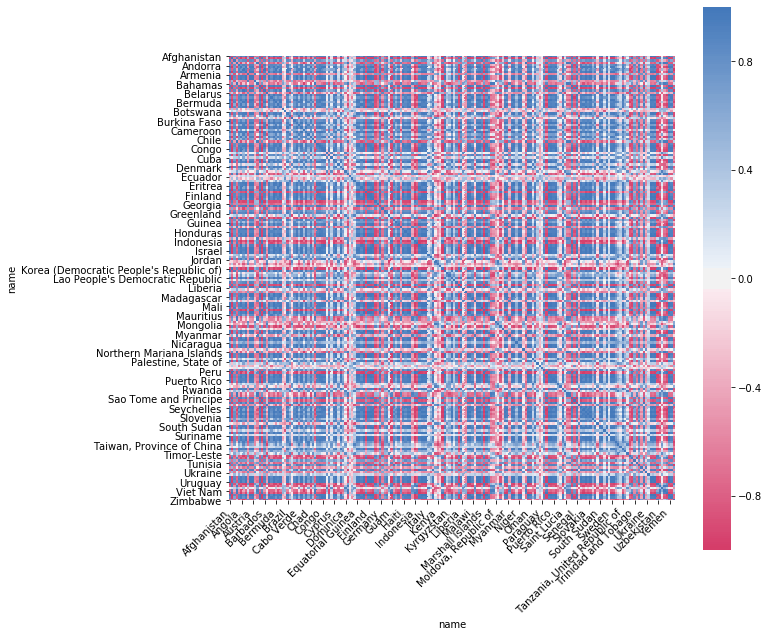

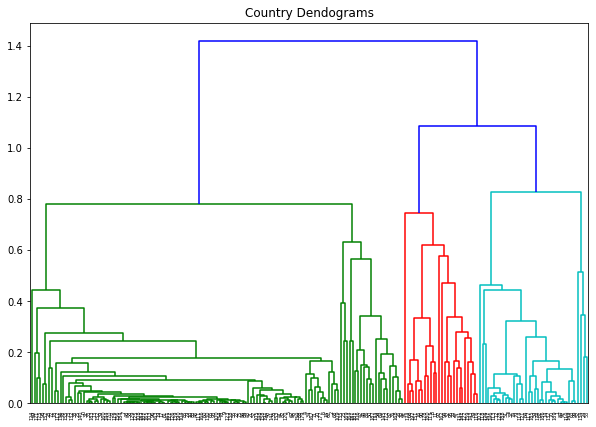

In [115]:
disease="Cardiovascular diseases"
measure="DALYs (Disability-Adjusted Life Years)"
plot_world_groups(rateData, disease, measure, cut_off_Range=np.arange(0, 2, 0.05), distance="correlation", linkage_type="average")

1000
193


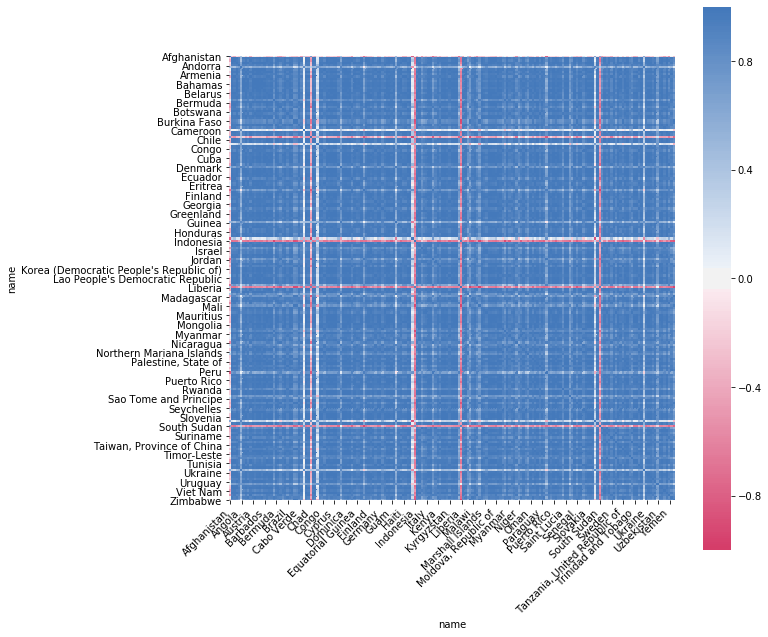

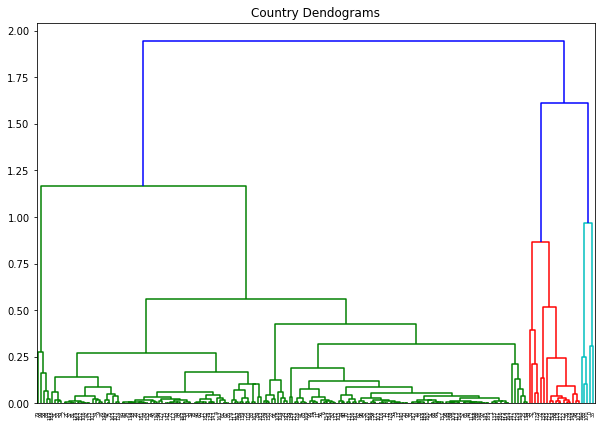

In [106]:
disease="Respiratory infections and tuberculosis"
measure="Incidence"
plot_world_groups(rateData, disease, measure, cut_off_Range=np.arange(0, 1, 0.02), distance="correlation")

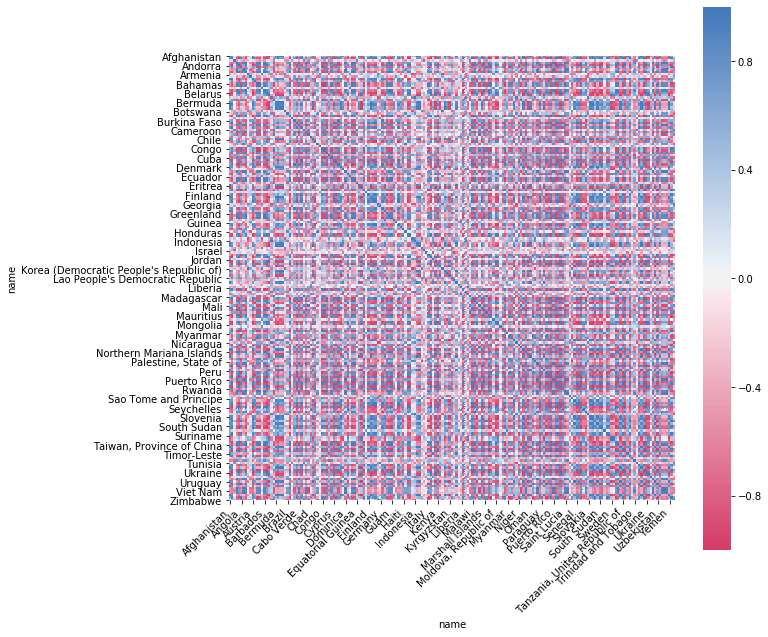

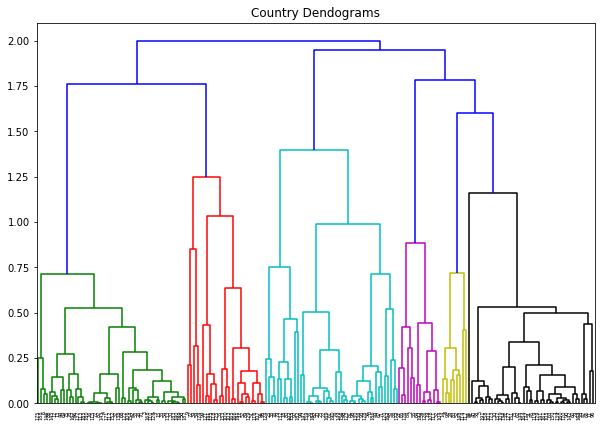

In [71]:
disease="Neglected tropical diseases and malaria"
measure="Incidence"
plot_world_groups(rateData, disease, measure, cut_off_Range=np.arange(0, 1, 0.02), distance="correlation")

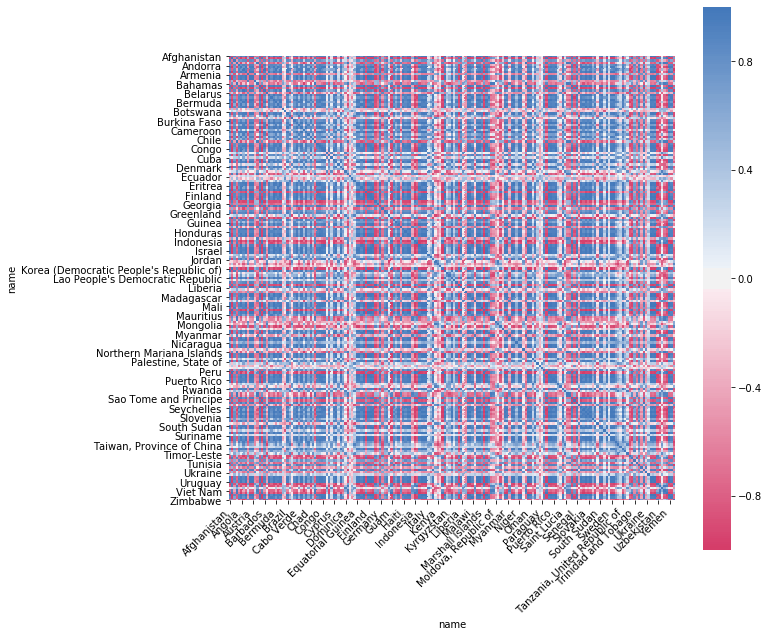

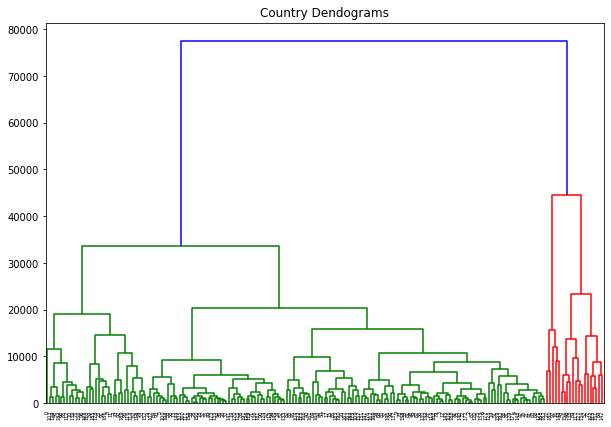

In [67]:
disease="Cardiovascular diseases"
measure="DALYs (Disability-Adjusted Life Years)"
plot_world_groups(rateData, disease, measure, cut_off_Range=np.arange(0, 20000, 1000), distance="euclidean")

# 3. How is the prevalence of different diseases linked to different risk factors?

## 3.1 Cardiovascular diseases

To better understand the risks factors for cardiovascular diseases, we analyse this dataset: https://www.kaggle.com/sulianova/cardiovascular-disease-dataset, which contains data about the health condition of a list of people, including whether or not they have cardiovascular diseases.

### 3.1.1 Data cleaning/exploration

In [ ]:
df=pd.read_csv( "./data/cardio_train.csv", delimiter=';')
print(df.shape)
df.head(5)

In [ ]:
# No missing data (yey!)
df.isnull().values.any()

The feature "age" is given as a integer amount of days, let's convert this to a float in years.

In [ ]:
# approximation: 1 year = 365 days
df['age'] = df['age'] / 365

**Let's check if each column has realistic values:**

In [ ]:
# The range of ages seems reasonable
print(np.sort(df['age'].unique()))

In [ ]:
# there seem to be some very short and tall people in this dataset !! (shortest person ever recorded was 54.6 cm)
print(np.sort(df['height'].unique()))

In [ ]:
# There seem to be many different very short people in this dataset, let's visualize the distribution.
hist = df.hist(bins=len(df['height'].unique()), column="height")
print(hist, df['height'].value_counts())

In [ ]:
# The distribution does seem to be sharply peaked around the realistic value. Let's remove the unrealistic outliers
realistic = df[df['height']>120]
realistic = realistic[realistic['height']<210]

In [ ]:
# Let's split the dataset into male and female and determine the average height
print('genders: '+str(realistic['gender'].unique()))

females = realistic[realistic['gender'] == 1]
males = realistic[realistic['gender'] == 2]

print('Average height of a female: '+ str(np.round(females['height'].mean(),2))+' cm')
print('Average height of a male: '+ str(np.round(males['height'].mean(),2))+' cm')

These values seem quiet low, however, we don't know when/where this data was recorded. <br>
We will get back to this and try to figure out where this data was recorded.

In [ ]:
# There are also some unrealistic low weight values (expressed in kg)
hist = realistic.hist(bins=80, column="weight")
hist

In [ ]:
print('low weights: '+str(np.sort(realistic['weight'].unique())[:10]))

In [ ]:
#Remove extremely low weights
realistic = realistic[realistic['weight']>35]

In [ ]:
# ap_hi: Systolic (arterial) blood pressure (pressure just outside the heart while it is ejecting)
# ap_hi: Diastolic (arterial) blood pressure (pressure just outside the heart while it is filling)
print(np.sort(realistic['ap_hi'].unique()))
print(np.sort(realistic['ap_lo'].unique()))

We can assume these negative pressures to be typos since their magnitude is realistic

In [ ]:
#Fix the negative values
realistic = realistic.abs()

In [ ]:
# In reality systolic blood pressure is rarely much lower lower than 90 or higher than 200
realistic = realistic[realistic['ap_hi']>59]
realistic = realistic[realistic['ap_hi']<241]
realistic = realistic[realistic['ap_lo']>39]
realistic = realistic[realistic['ap_lo']<200]
print(np.sort(realistic['ap_hi'].unique()))
print(np.sort(realistic['ap_lo'].unique()))

What is also an interesting and important parameter when trying to quantify the performance of the heart is "Pulse Pressure" (ap_pulse) which can simply be calculated as follows: ap_pulse = ap_hi - ap_lo.

In [ ]:
# Let's add thise parameter into our dataframe
realistic['ap_pulse'] = realistic['ap_hi'] - realistic['ap_lo']
df1 = realistic.pop('cardio')
realistic['cardio'] = df1
realistic.head()

In [ ]:
# We find that in some cases the the diastolic pressure is higher than the systolic pressure, this is physiologically impossible.
print(np.sort(realistic['ap_pulse'].unique()))

In [ ]:
# Remove negative values and unrealisticly high values.
realistic = realistic[realistic['ap_pulse']>0]
realistic = realistic[realistic['ap_pulse']<100]
print(np.sort(realistic['ap_pulse'].unique()))

In [ ]:
# The other features seem to be clean
print(np.sort(realistic['cholesterol'].unique()))
print(np.sort(realistic['gluc'].unique()))
print(np.sort(realistic['smoke'].unique()))
print(np.sort(realistic['alco'].unique()))
print(np.sort(realistic['active'].unique()))
print('Data lost in the cleaning process: '+str(100*(70000-realistic.shape[0])/70000)+' %')

In [ ]:
corr = realistic.corr()
corr

**Now let's see how the different features are correlated.**

In [ ]:
corr = realistic.corr()

fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(0, 250, n=200),
    square=True
)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
ax.set_title('Correlation Matrix')
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

In [ ]:
corr

In [ ]:
fig = go.Figure(data=go.Heatmap(
                   z=corr,
                   x=corr.index,
                   y=corr.columns,
                   hoverongaps = True, colorscale='Blues'))
fig.show()


**Implementing a measure of obesity: BMI**

Height & weight are also clearly strongly correlated, which makes a lot of sense. We would be more interested in the "obesity" of the patient, which is better quantified by the Body Mass Index: BMI = weight / height². Let us remove "height" and "weight" from out dataframe and instead combine them into BMI.

In [ ]:
df = realistic

df['weight'] = df['weight'] / (df['height']/100)**2
df = df.rename(columns = {"weight": "BMI"})
df = df.drop(columns=['height'])
df.head()

The very last column of the data "cardio" is a binary value which determines wether the concidered person was diagnosed with cardio vascular disease. <br> Note that in reality this is not at all "binary", as it doesn't quanity the severity/type of cardio vascular disease.<br>

Let's try to get a **deeper understanding of the different features in this dataset before attemption to draw conclusions.**

### 3.1.2 Age

Why is cardiovascular disease the most common cause of death? <br>
From a medical point of view, cardiovascular disease is fairly well understood, so why is it that as of today it can't simply be prevented?

It turns out that cardiovascular disease comes with a certain level of "inevetability", this is in part due to a phenonmenon known as "arterial stiffening" which is directly related to ageing.

Large arteries are roughly devided into 3 main sections:
<img src="section-artery.jpg" width="400" height="180">

It is the middle section that causes the main problem, it contains elastic fibres (a protein known as elastin) which gives the artery its elastic properties and helps the blood to be pumped around in your body. As it turns out, since this layer is sandwhiched between two other layers, our body has trouble repairing/replacing the elastin as it degrades over time. Additionally it has been shown that elastin proteins have an approximate half-life of 74 years (Shapiro et al., 1991). This value is relatively close to the current life expectancy in developed countries (~80y). <br> (Another direct reason for ageing is telomere shorting which causes DNA damage and cell death).

Observe that, the feature "age" is strongly correlation to the prevalence of cardio vascular disease which is very much expected concidering what was discussed above.

### 3.1.3 Cholesterol

Cholesterol plays a crucial role in the cell membrane of every cell in your body, it also helps your body synthesize steroid hormones, bile acid and vitamin D. So how is it possible that its prevalence is so strongly correlated to the most common cause of death?

Cholesterol is a lipid, it is a type of "fat". It can build up excessively in the blood circulation and can be hard for the body to remove. The cholesterol (plaque) attaches to the blood vessel walls caussing them to narrow. This negatively effects the heamodynamics and can ultimately result in total occlusion of a blood vessle. The blockage results in poor perfusion and thus insufficient oxygen being delivered to the tissue.<br>

<img src="plaque.png" width="300" height="130">

This process is accelerated by a unhealthy diet and is thus correlated to obesity.

### 3.1.4 Blood Pressure

elevated blood pressure is in general a result of many influencing factors.

* Short term: When you drink a large amount of fluid or eat something (salty), your blood pressure will rise. In young, healthy individuals the body is easily counteracts this by its many negative feedback loops.

* Long term: Blood pressure increases with age as a result of arterial stiffening, build up of cholesterol, ... <br>

Note that cardiovascular disease, especially coronary heart disease is a **positive feedbackloop**! This is exactly what makes it so deadly. <br>
explanation: If the heart lowers in function, it is unable to pump blood around the body properly and provide the different tissues of sufficient oxygen. This means all tissues in the body will lower in function, including the heart muscles themselves. This causes the heart function to decrease even further. This escalates in a condition known as heart failure.

### 3.1.5 Other interesting correlations

Interestingly, the strongest correlations in this dataset are not related to cardiovascular disease:

- height ~ gender
- height ~ weight
- cholesterol ~ glocuse levels (unhealthy diet)
- smoking ~ alcohol (unhealthy lifestyles)
- smoking ~ gender

**side quest:** Especially the last correlation is interesting. Which gender smokes most? How big is this difference?

In [ ]:
GS = df[['gender','smoke']]

females = GS[GS['gender']==1]
males = GS[GS['gender']==2]

print('male smokers: '+str(np.round(100*sum(males['smoke'])/males.size, 3))+'%')
print('female smokers: '+str(np.round(100*sum(females['smoke'])/females.size, 3))+'%')

According to this dataset, men smoke 10x more than woman!<br>
This approximately agrees with findings in literature.

### 3.1.6 Feature importance

Correlations alone aren't always an accurate way of describing which features are truly important. Forest algorithm to determine which features are important:

In [ ]:
X = df.iloc[:,1:-1]
y = df.iloc[:,-1]

In [ ]:
forest = ExtraTreesClassifier(n_estimators=250,
                              random_state=0)

forest.fit(X, y)
importances = forest.feature_importances_ 
std = np.std([tree.feature_importances_ for tree in forest.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

for f in range(X.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]])+X.columns[indices[f]])



In [ ]:
X.columns.to_list()

In [ ]:
to_plot = pd.DataFrame({ "Description" : X.columns.to_list() , "importances" : importances, "std" : std, })
to_plot

In [ ]:
to_plot.sort_values(by = "importances", ascending= False,  inplace = True)

In [ ]:
fig = go.Figure()
fig.add_trace(go.Bar(
    name='Control',
    x=to_plot["Description"],
    y=to_plot["importances"],
    error_y=dict(type='data', array=to_plot["std"]),
))

fig.update_layout(barmode='group', xaxis=dict(type='category'), title_text = "Feature importance")
fig.show()

In [ ]:
# Plot the feature importances of the forest
plt.figure()
plt.title("Feature importances")
plt.bar(range(X.shape[1]), importances[indices], color=[(1, 0, 0, 1),(1, 0.7, 0, 1),(0.8, 1, 0, 1),(0.1, 1, 0.3, 1),(0, 1, 0.7, 1),(0, 0.7, 1, 1),(0, 0, 1, 1),(0.3, 0, 1, 1)], yerr=std[indices], align="center")
plt.xticks(range(X.shape[1]), indices)
plt.xlim([-1, X.shape[1]])
plt.show()

PLOT ABOVE: to embed!

We find similar results as to the correlations, however, here the blood pressure seems to play much more important role. 
BMI also turns out to be a very important factor!

### 3.1.7 Conclusion

Many of the above factors can not directly be influenced/solved: 
* We can't prevent ourselves from ageing 
* High blood pressure is a result of other factors: ageing (arterial stiffening), cholesterol levels, salt/fluid intake, ...

So in order to **minimize our risk of cardiovascular disease** we should try to keep our BMI and cholesterol levels as low as possible. <br>
This can both be done be following a **healthy diet and working out (burning fat).**

## 3.2 Further risk factor analysis

We can now do the following things:
* Use the data from question 1 to analyse specific risk factors and the phenomena observed in that question.
* Perform analyses like this one for cardiovascular diseases for other diseases.
* Try to link the risk factors identified here with health data about different countries.

## 3.3 Risk factors in GBD dataset

In [ ]:
df_risk_exposure = pd.read_csv("data/risk-exposure.csv")
df_risk_exposure = replace_names(df_risk_exposure, pairDf["Country"], pairDf["Replacement"])
df_risk_exposure

Which risk factors are in the GBD dataset?

In [ ]:
print(df_risk_exposure['rei'].unique())

In [ ]:
df_risk_exposure['year'].sort_values().unique()

In [ ]:
health_risk_factors = pd.read_csv("data/health_risk_factors.csv")
health_risk_factors

In [ ]:
environmental_risk_factors = pd.read_csv("data/environmental_risk_factors.csv")
environmental_risk_factors

In [ ]:
print(df_risk_exposure.rei.unique())
print(environmental_risk_factors['Series Name'].unique())
print(health_risk_factors['Series Name'].unique())

In [ ]:
df = pd.read_csv("data/environmental_risk_factors.csv")
years = {}
index = ['1990 [YR1990]', '1991 [YR1991]', '1992 [YR1992]', '1993 [YR1993]',
       '1994 [YR1994]', '1995 [YR1995]', '1996 [YR1996]', '1997 [YR1997]',
       '1998 [YR1998]', '1999 [YR1999]', '2000 [YR2000]', '2001 [YR2001]',
       '2002 [YR2002]', '2003 [YR2003]', '2004 [YR2004]', '2005 [YR2005]',
       '2006 [YR2006]', '2007 [YR2007]', '2008 [YR2008]', '2009 [YR2009]',
       '2010 [YR2010]', '2011 [YR2011]', '2012 [YR2012]', '2013 [YR2013]',
       '2014 [YR2014]', '2015 [YR2015]', '2016 [YR2016]', '2017 [YR2017]',]
year = 1990
for x in index:
    years[x] = year
    year +=1

df.rename(years, axis = 1, inplace= True)

df_exploded  = df.melt(id_vars=df.columns.to_list()[0: 4],
        var_name="Year",
        value_name="Value").drop(["Series Code"], 1)

df_exploded["Value"] = df_exploded["Value"].replace("..",0).astype(float)
df_exploded["Year"] = df_exploded["Year"].astype(int)

df_final = pd.pivot_table(df_exploded, index=["Country Name", "Country Code", "Year"], columns="Series Name", values="Value")
df_final = df_final.replace(0,np.nan)

In [ ]:
df_final

In [ ]:
cardiovascular_diseases = countryInfo.merge(dalys[dalys.cause =="Cardiovascular diseases"], left_on = 'name', right_on = 'location', how = 'left')
cardiovascular_diseases = cardiovascular_diseases[['alpha-3','val','year']]
cardiovascular_diseases

In [ ]:
df_final.reset_index()

In [ ]:
df_merged = df_final.merge(cardiovascular_diseases, left_on="Country Code", right_on="alpha-3")
df_merged.set_index(['alpha-3','year'])

Let's look at alcohol use.

In [ ]:
df_risk_exposure[df_risk_exposure.rei =='Alcohol use'].describe()

In [ ]:
alcohol_sev = df_risk_exposure[df_risk_exposure.rei =='Alcohol use'][['location','val','year']]
alcohol_sev

In [ ]:
pure_alcohol_use = pd.read_csv("data/total-alcohol-consumption-per-capita-litres-of-pure-alcohol.csv")
pure_alcohol_use = pure_alcohol_use.rename(columns={"Alcohol consumption (litres per capita) (liters of pure alcohol, projected estimates, 15+ years of age)":"alcohol"})
pure_alcohol_use

In [ ]:
map_test2 = countryInfo.merge(alcohol_sev, left_on = 'name', right_on = 'location', how = 'left')
map_test2.dropna(subset=['year'], axis = 0, inplace= True)
slider_map(map_test2, z_col_name = "val", title = "Alcohol use SEV (%)", year_col = 'year', country_col_name='name', location_col_name ='alpha-3',zmin = 0, zmax = 40)

In [ ]:
map_test2 = countryInfo.merge(pure_alcohol_use, left_on = 'alpha-3', right_on = 'Code', how = 'right')
map_test2.dropna(subset=['Year'], axis = 0, inplace= True)
slider_map(map_test2, z_col_name = "alcohol", title = "Alcohol in liters of pure alcohol per capita in 2016", year_col = 'Year', country_col_name='name', location_col_name ='Code',zmin = 0, zmax = 16)

In [ ]:
dalys = data2[(data2.measure=="DALYs (Disability-Adjusted Life Years)") & (data2.metric == 'Rate')][['location', 'cause', 'val','year']]
dalys_pivoted = dalys[dalys.year==2016].pivot(index='location',columns='cause',values='val')
dalys_pivoted

In [ ]:
deaths = data2[(data2.measure=="Deaths") & (data2.metric == 'Rate')][['location', 'cause', 'val','year']]
deaths_pivoted = deaths[deaths.year==2016].pivot(index='location',columns='cause',values='val')
deaths_pivoted

In [ ]:
#dalys_alcohol.stack('cause')

In [ ]:
alcohol_sev_2017 = alcohol_sev[alcohol_sev.year==2017].set_index('location')['val']
alcohol_sev_2017

In [ ]:
alcohol_use = countryInfo.merge(pure_alcohol_use, left_on = 'alpha-3', right_on = 'Code', how = 'inner').set_index('name')[['alcohol']]
alcohol_use

In [ ]:
dalys_pivoted.corrwith(alcohol_use.alcohol,drop=True).sort_values(ascending=False)

In [ ]:
deaths_pivoted.corrwith(alcohol_use.alcohol,drop=True).sort_values(ascending=False)

In [ ]:
dalys_pivoted.corrwith(alcohol_sev_2017).sort_values(ascending=False)

In [ ]:
dalys_alcohol[(dalys_alcohol.year==2017)&(dalys_alcohol.cause=="Musculoskeletal disorders")][['DALYs','alcohol_sev']].corr()

# 4. How is this linked to the living conditions within each country?

## 4.1 Economics

REPLACE by analysis/visualisation Aurélien + ADD ML analysis (just like risk factors)

Gather economical data and merge them to the dataset and continue exploration with this dataset (to find links)

In [ ]:
economic = pd.read_csv("data/gdp_capita.csv")
economic

In [ ]:
#exploded = economic.explode([economic.columns.to_list()[4: -1]])
exploded = economic.melt(id_vars=economic.columns.to_list()[0: 4], 
        var_name="Year", 
        value_name="GDP").drop(["Indicator Name","Indicator Code" ], 1)

In [ ]:
exploded['Year'] = pd.to_numeric(exploded['Year'],errors='coerce')
exploded


To merge it with our dataframe we need to explode the years

In [ ]:
merged = pd.merge(normalized, exploded, how = "inner", left_on = ["Code", "Year"], right_on=["Country Code","Year"])


In [ ]:
merged

In [ ]:
@interact
def scatter_plot(x=list(merged.select_dtypes('number').columns), 
                 y=list(merged.select_dtypes('number').columns)[1:],
                 year = list(np.append(merged.Year.unique(),[0])),
                 country = list(np.append(merged.Entity.unique(),["All"])),
                 theme =list(cf.themes.THEMES.keys()), 
                 colorscale=list(cf.colors._scales_names.keys())):
    norm = merged
    if country != "All" : 
                        norm = norm[norm['Entity']==country] 
    if year != 0 : 
                    norm = norm[norm['Year']==year] 
                
    norm.iplot(kind='scatter', x=x, y=y, mode='markers', 
             xTitle=x.title(), yTitle=y.title(), 
             text='Entity',
             title=f'{y.title()} vs {x.title()}',
            theme=theme, colorscale=colorscale)

This does not seem to provide very clear conclusions yet. What can still be done:
* Perform statistical analyses on this data (e.g. look for a correlation).
* Look for other data on the living conditions of a country (e.g. HDI, Gini inequality index, government health budget)
* Try to cluster countries which exhibit similar characteristics.